# Clustering the Functions

## Preprocessing

In [1]:
import sys
import numpy as np
import pandas as pd
import os

functionPropertiesNames = ['BasicBlockCount', 'BlocksReachedFromConditionalInstruction',
                           'Uses', 'DirectCallsToDefinedFunctions', 'LoadInstCount', 
                           'StoreInstCount', 'MaxLoopDepth', 'TopLevelLoopCount']

In [11]:
passPipelineDF = pd.read_csv('passPipelineDF.csv', header=[0,1])
passPipelineDF.drop(['Unnamed: 0_level_0'], level = 0, axis = 1, inplace=True)
passPipelineDF

Pass Number               0  \
                     Function Name BasicBlockCount   
0                   term_TopSymbol               1   
1          clause_LiteralIsLiteral               3   
2               symbol_IsPredicate               3   
3          clause_LiteralPredicate               1   
4      clause_LiteralComputeWeight              17   
..                             ...             ...   
295  memory_CalculateRealBlockSize               5   
296         clause_LiteralsCompare               1   
297            clause_UpdateWeight               1   
298      symbol_IsStandardVariable               3   
299                    list_Member               7   

                                                  \
    BlocksReachedFromConditionalInstruction Uses   
0                                         0   36   
1                                         2    2   
2                                         2    2   
3                                         0    7   
4                                        12    3   
..                                      ...  ...   
295                                       4    1   
296                                       0    1   
297                                       0    1   
298                                       2    1   
299                                       4    1   

                                                                             \
    DirectCallsToDefinedFunctions LoadInstCount StoreInstCount MaxLoopDepth   
0                               0             2              1            0   
1                               2             2              1            0   
2                               2             2              1            0   
3                               2             1              1            0   
4                              20            14              9            2   
..                            ...           ...            ...          ...   
295                             0            11              4            0   
296                             2             2              2            0   
297                             1             3              3            0   
298                             1             2              1            0   
299                             3             6              6            1   

                                    1  ...          284                    \
    TopLevelLoopCount BasicBlockCount  ... MaxLoopDepth TopLevelLoopCount   
0                   0               1  ...          NaN               NaN   
1                   0               3  ...          0.0               0.0   
2                   0               3  ...          NaN               NaN   
3                   0               1  ...          NaN               NaN   
4                   1              17  ...          2.0               1.0   
..                ...             ...  ...          ...               ...   
295                 0               5  ...          NaN               NaN   
296                 0               1  ...          0.0               0.0   
297                 0               1  ...          NaN               NaN   
298                 0               3  ...          NaN               NaN   
299                 1               7  ...          NaN               NaN   

                285                                               \
    BasicBlockCount BlocksReachedFromConditionalInstruction Uses   
0               NaN                                     NaN  NaN   
1               6.0                                     6.0  1.0   
2               NaN                                     NaN  NaN   
3               NaN                                     NaN  NaN   
4              16.0                                    16.0  1.0   
..              ...                                     ...  ...   
295             NaN                                     NaN  NaN   
2

In [13]:
with open("passList.txt") as f:
    passList = eval(f.read())

In [14]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objs as go
%matplotlib inline

In [15]:
scaler = MinMaxScaler()
X_scale = scaler.fit_transform(passPipelineDF.drop(columns=['Function Name'], level=1))
X_scale

array([[0.        , 0.        , 0.40229885, ...,        nan,        nan,
               nan],
       [0.03333333, 0.03703704, 0.01149425, ..., 0.        , 0.        ,
        0.        ],
       [0.03333333, 0.03703704, 0.01149425, ...,        nan,        nan,
               nan],
       ...,
       [0.        , 0.        , 0.        , ...,        nan,        nan,
               nan],
       [0.03333333, 0.03703704, 0.        , ...,        nan,        nan,
               nan],
       [0.1       , 0.07407407, 0.        , ...,        nan,        nan,
               nan]])

In [16]:
passPipelineDFScale = pd.DataFrame(X_scale, columns=passPipelineDF.drop(columns=['Function Name'], level=1).columns)
passPipelineDFScale

0                                                    \
    BasicBlockCount BlocksReachedFromConditionalInstruction      Uses   
0          0.000000                                0.000000  0.402299   
1          0.033333                                0.037037  0.011494   
2          0.033333                                0.037037  0.011494   
3          0.000000                                0.000000  0.068966   
4          0.266667                                0.222222  0.022989   
..              ...                                     ...       ...   
295        0.066667                                0.074074  0.000000   
296        0.000000                                0.000000  0.000000   
297        0.000000                                0.000000  0.000000   
298        0.033333                                0.037037  0.000000   
299        0.100000                                0.074074  0.000000   

                                                                             \
    DirectCallsToDefinedFunctions LoadInstCount StoreInstCount MaxLoopDepth   
0                        0.000000      0.027778       0.024390     0.000000   
1                        0.041667      0.027778       0.024390     0.000000   
2                        0.041667      0.027778       0.024390     0.000000   
3                        0.041667      0.013889       0.024390     0.000000   
4                        0.416667      0.194444       0.219512     0.666667   
..                            ...           ...            ...          ...   
295                      0.000000      0.152778       0.097561     0.000000   
296                      0.041667      0.027778       0.048780     0.000000   
297                      0.020833      0.041667       0.073171     0.000000   
298                      0.020833      0.027778       0.024390     0.000000   
299                      0.062500      0.083333       0.146341     0.333333   

                                    1                                          \
    TopLevelLoopCount BasicBlockCount BlocksReachedFromConditionalInstruction   
0                 0.0        0.000000                                0.000000   
1                 0.0        0.033333                                0.037037   
2                 0.0        0.033333                                0.037037   
3                 0.0        0.000000                                0.000000   
4                 0.2        0.266667                                0.222222   
..                ...             ...                                     ...   
295               0.0        0.066667                                0.074074   
296               0.0        0.000000                                0.000000   
297               0.0        0.000000                                0.000000   
298               0.0        0.033333                                0.037037   
299               0.2        0.100000                                0.074074   

     ...          284                               285  \
     ... MaxLoopDepth TopLevelLoopCount BasicBlockCount   
0    ...          NaN               NaN             NaN   
1    ...          0.0               0.0        0.089286   
2    ...          NaN               NaN             NaN   
3    ...          NaN               NaN             NaN   
4    ...          0.5               0.1        0.267857   
..   ...          ...               ...             ...   
295  ...          NaN               NaN             NaN   
296  ...          0.0               0.0        0.000000   
297  ...          NaN               NaN             NaN   
298  ...          NaN               NaN             NaN   
299  ...          NaN               NaN             NaN   

                                                  \
    BlocksReachedFromConditionalInstruction Uses   
0                                       NaN  NaN   
1                                  0.081081  0.0   
2         

In [17]:
passPipelineDFScale['count'] = passPipelineDFScale.count(axis=1)
passPipelineDFScale

0                                                    \
    BasicBlockCount BlocksReachedFromConditionalInstruction      Uses   
0          0.000000                                0.000000  0.402299   
1          0.033333                                0.037037  0.011494   
2          0.033333                                0.037037  0.011494   
3          0.000000                                0.000000  0.068966   
4          0.266667                                0.222222  0.022989   
..              ...                                     ...       ...   
295        0.066667                                0.074074  0.000000   
296        0.000000                                0.000000  0.000000   
297        0.000000                                0.000000  0.000000   
298        0.033333                                0.037037  0.000000   
299        0.100000                                0.074074  0.000000   

                                                                             \
    DirectCallsToDefinedFunctions LoadInstCount StoreInstCount MaxLoopDepth   
0                        0.000000      0.027778       0.024390     0.000000   
1                        0.041667      0.027778       0.024390     0.000000   
2                        0.041667      0.027778       0.024390     0.000000   
3                        0.041667      0.013889       0.024390     0.000000   
4                        0.416667      0.194444       0.219512     0.666667   
..                            ...           ...            ...          ...   
295                      0.000000      0.152778       0.097561     0.000000   
296                      0.041667      0.027778       0.048780     0.000000   
297                      0.020833      0.041667       0.073171     0.000000   
298                      0.020833      0.027778       0.024390     0.000000   
299                      0.062500      0.083333       0.146341     0.333333   

                                    1                                          \
    TopLevelLoopCount BasicBlockCount BlocksReachedFromConditionalInstruction   
0                 0.0        0.000000                                0.000000   
1                 0.0        0.033333                                0.037037   
2                 0.0        0.033333                                0.037037   
3                 0.0        0.000000                                0.000000   
4                 0.2        0.266667                                0.222222   
..                ...             ...                                     ...   
295               0.0        0.066667                                0.074074   
296               0.0        0.000000                                0.000000   
297               0.0        0.000000                                0.000000   
298               0.0        0.033333                                0.037037   
299               0.2        0.100000                                0.074074   

     ...               284             285  \
     ... TopLevelLoopCount BasicBlockCount   
0    ...               NaN             NaN   
1    ...               0.0        0.089286   
2    ...               NaN             NaN   
3    ...               NaN             NaN   
4    ...               0.1        0.267857   
..   ...               ...             ...   
295  ...               NaN             NaN   
296  ...               0.0        0.000000   
297  ...               NaN             NaN   
298  ...               NaN             NaN   
299  ...               NaN             NaN   

                                                  \
    BlocksReachedFromConditionalInstruction Uses   
0                                       NaN  NaN   
1                                  0.081081  0.0   
2                                       NaN  NaN   
3                                       NaN  NaN   
4                                  0.216216  0.0   
..                     

In [18]:
passPipelineDFScale.fillna(-1, inplace=True)

## Feature Reduction via t-SNE

In [59]:
pca_50 = PCA(n_components=50, random_state=100)
pca_result_50 = pca_50.fit_transform(passPipelineDFScale.drop(columns=['count']))

/Users/tarindujayatilaka/opt/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:3936: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



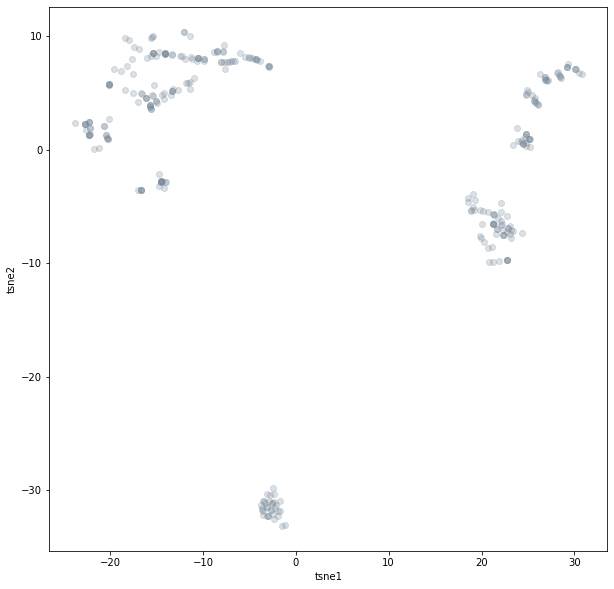

In [60]:
tsne = TSNE(random_state=123)
tsne_scale_results = tsne.fit_transform(pca_result_50)
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=['tsne1', 'tsne2'])
plt.figure(figsize = (10,10))
plt.scatter(tsne_df_scale.iloc[:,0],tsne_df_scale.iloc[:,1],alpha=0.25, facecolor='lightslategray')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.show()

## K-Means

Text(0, 0.5, 'Inertia')

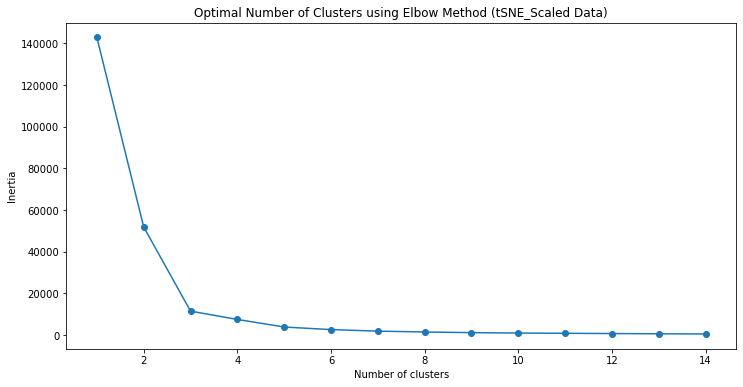

In [61]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(tsne_df_scale)
    sse.append([k, km.inertia_])
    
tsne_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (tSNE_Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')


In [62]:
kmeans_tsne_scale = KMeans(n_clusters=6, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(tsne_df_scale)
print('KMeans tSNE Scaled Silhouette Score: {}'.format(silhouette_score(tsne_df_scale, kmeans_tsne_scale.labels_, metric='euclidean')))
labels_tsne_scale = kmeans_tsne_scale.labels_
clusters_tsne_scale = pd.concat([tsne_df_scale, pd.DataFrame({'tsne_clusters':labels_tsne_scale})], axis=1)

KMeans tSNE Scaled Silhouette Score: 0.623714029788971


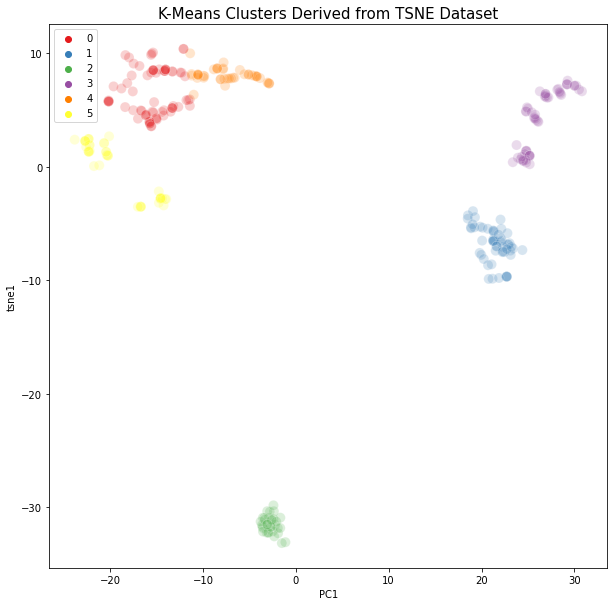

In [63]:
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_tsne_scale.iloc[:,0], clusters_tsne_scale.iloc[:,1], 
                hue=labels_tsne_scale, 
                palette='Set1',
                s=100, alpha=0.2).set_title('K-Means Clusters Derived from TSNE Dataset', fontsize=15)
plt.legend()
plt.ylabel('tsne1')
plt.xlabel('PC1')
plt.show()

In [64]:
#get only one property
BasicBlockCountDF = passPipelineDF.drop(columns=['Pass Number'], level=0)
BasicBlockCountDF = BasicBlockCountDF[BasicBlockCountDF.columns[0::8]]
BasicBlockCountDF.columns = list(range(len(passList)))
BasicBlockCountDF = BasicBlockCountDF.apply(pd.to_numeric)
BasicBlockCountDF = pd.concat([BasicBlockCountDF, pd.DataFrame({'cluster_scaled':labels_tsne_scale})], axis=1)
BasicBlockCountDF

,0,1,2,3,4,5,6,7,8,9,...,277,278,279,280,281,282,283,284,285,cluster_scaled
0,1,1,1,1,1,1,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
1,3,3,3,3,3,3,3,3,3,3,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2
2,3,3,3,3,3,3,3,3,3,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,1,1,1,1,1,1,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
4,17,17,17,17,14,14,14,14,14,14,...,17.0,16.0,16.0,16.0,16.0,16.0,16.0,16.0,16.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,5,5,5,5,5,5,5,5,5,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
296,1,1,1,1,1,1,1,1,1,1,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2
297,1,1,1,1,1,1,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
298,3,3,3,3,1,1,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [65]:
import plotly.graph_objects as go

joined_df = BasicBlockCountDF.copy()

cmap = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']
functions = passPipelineDF.loc[:, [('Pass Number', 'Function Name')]].to_numpy()
passes = pd.DataFrame(passList).to_numpy()

fig = go.Figure(go.Scatter(
    hovertemplate =
    '<i>Price</i>: $%{y:.2f}'+
    '<br><b>X</b>: %{x}<br>'+
    '<b>%{text}</b>',
    showlegend = False))

for index, row in joined_df.iterrows():
    fn_name = functions[index][0]
    fig.add_trace(go.Scatter(
                        x=row[:-1].index.to_numpy(), 
                        y=row[:-1].to_numpy(),
                        text= passes,
                        hovertemplate = 'Function Name: ' + fn_name 
                                    + '<br>Function No: ' + str(index) 
                                    + '<br>Pass Name: %{text}'
                                    + '<br>Pass No: %{x} ' 
                                    + '<br>BasicBlockCount: %{y}',
                        mode='lines',
                        marker_color=cmap[int(row['cluster_scaled'])],
                        name='',
                        showlegend = False
        )
    )
    
fig.show()

## DBSCAN on t-SNE

In [66]:
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=3, min_samples=20)
db.fit(tsne_scale_results)

labels_tsne_scale = db.fit_predict(tsne_scale_results)
clusters_tsne_scale = pd.concat([tsne_df_scale, pd.DataFrame({'tsne_clusters':labels_tsne_scale})], axis=1)

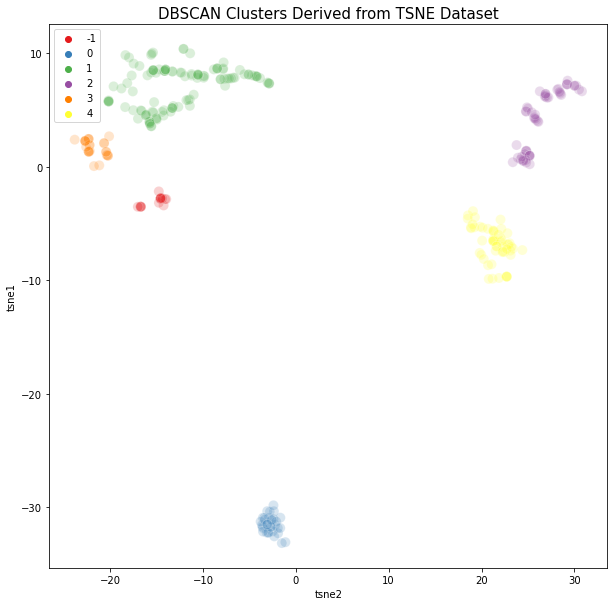

In [67]:
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_tsne_scale.iloc[:,0], clusters_tsne_scale.iloc[:,1], 
                hue=labels_tsne_scale, 
                palette='Set1',
                s=100, alpha=0.2).set_title('DBSCAN Clusters Derived from TSNE Dataset', fontsize=15)
plt.legend()
plt.ylabel('tsne1')
plt.xlabel('tsne2')
plt.show()

In [68]:
import plotly.graph_objects as go

def getFeatureSubplot(feature_no):
    #get only one property
    FeatureDF = passPipelineDF.drop(columns=['Pass Number'], level=0)
    FeatureDF = FeatureDF[FeatureDF.columns[feature_no::8]]
    FeatureDF.columns = list(range(len(passList)))
    FeatureDF = FeatureDF.apply(pd.to_numeric)
    FeatureDF = pd.concat([FeatureDF, pd.DataFrame({'cluster_scaled':labels_tsne_scale})], axis=1)
    FeatureDF
    
    joined_df = FeatureDF.copy()

    cmap = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']
    functions = passPipelineDF.loc[:, [('Pass Number', 'Function Name')]].to_numpy()
    passes = pd.DataFrame(passList).to_numpy()

    
    fig, axs = plt.subplots(1, 1, figsize = (16,4))

    for index, row in joined_df.iterrows():
        axs.plot(row[:-1], label=index, color=cmap[int(row['cluster_scaled'])])
    axs.set_xlabel("Pass", fontsize=18)
    axs.set_ylabel(functionPropertiesNames[feature_no], fontsize=18)
    
    """fig = go.Figure(go.Scatter(
        hovertemplate =
        '<i>Price</i>: $%{y:.2f}'+
        '<br><b>X</b>: %{x}<br>'+
        '<b>%{text}</b>',
        showlegend = False))

    for index, row in joined_df.iterrows():
        fn_name = functions[index][0]
        fig.add_trace(go.Scatter(
                            x=row[:-1].index.to_numpy(), 
                            y=row[:-1].to_numpy(),
                            text= passes,
                            hovertemplate = 'Function Name: ' + fn_name 
                                        + '<br>Function No: ' + str(index) 
                                        + '<br>Pass Name: %{text}'
                                        + '<br>Pass No: %{x} ' 
                                        + '<br>BasicBlockCount: %{y}',
                            mode='lines',
                            marker_color=cmap[int(row['cluster_scaled'])],
                            name='',
                            showlegend = False
            )
        )
    """
    return fig

In [69]:
functionPropertiesNames = ['BasicBlockCount', 'BlocksReachedFromConditionalInstruction',
                           'Uses', 'DirectCallsToDefinedFunctions', 'LoadInstCount', 
                           'StoreInstCount', 'MaxLoopDepth', 'TopLevelLoopCount']

/Users/tarindujayatilaka/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



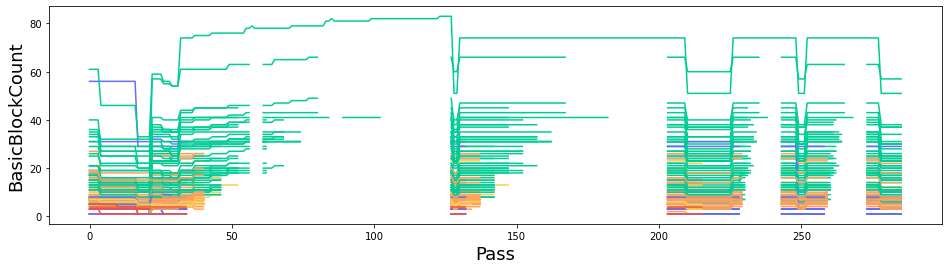

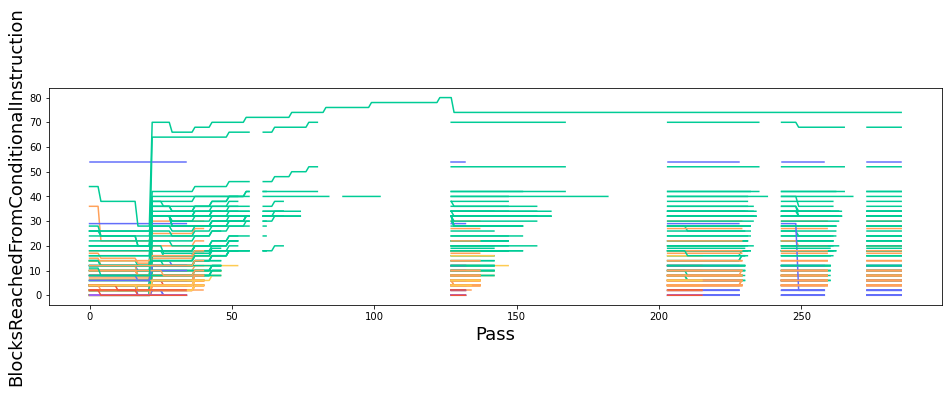

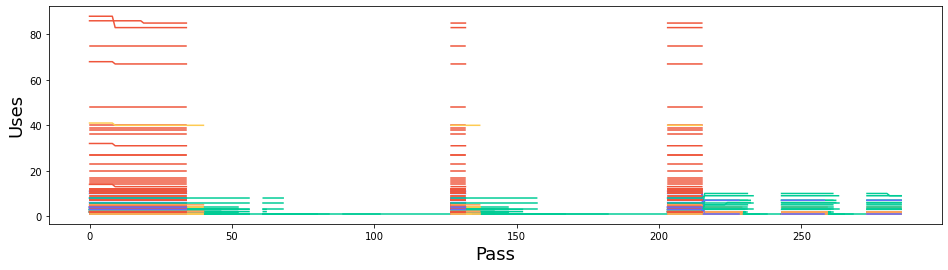

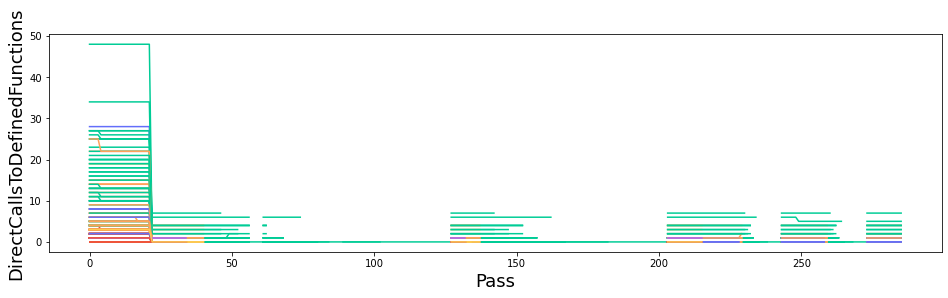

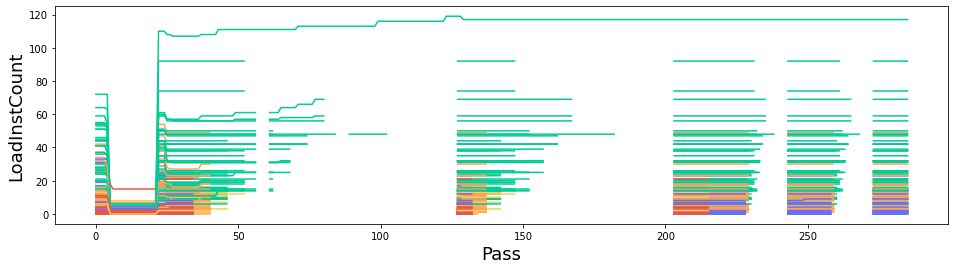

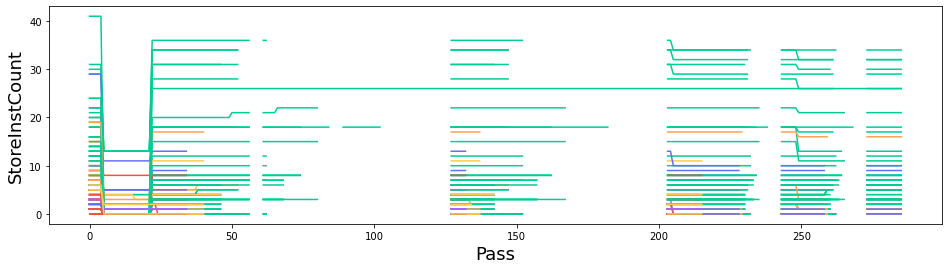

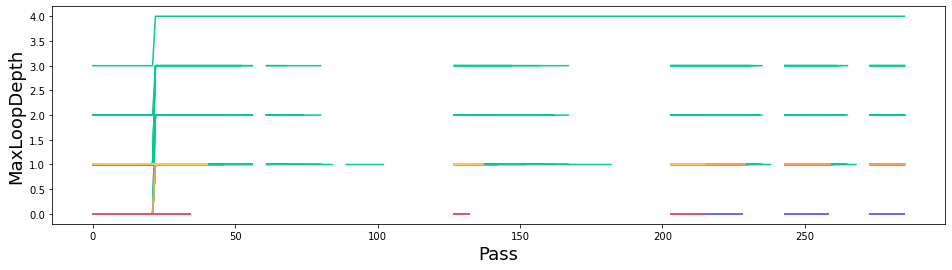

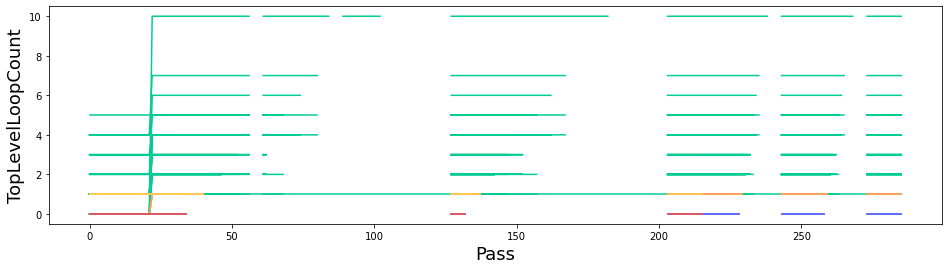

In [71]:
for i in range(len(functionPropertiesNames)):
    getFeatureSubplot(i).show()

## Only Max Length Pass Pipeline from the Cluster

In [74]:
import plotly.graph_objects as go

def getFeatureSubplot(feature_no):
    #get only one property
    FeatureDF = passPipelineDF.drop(columns=['Pass Number'], level=0)
    FeatureDF = FeatureDF[FeatureDF.columns[feature_no::8]]
    FeatureDF.columns = list(range(len(passList)))
    FeatureDF = FeatureDF.apply(pd.to_numeric)
    FeatureDF = pd.concat([FeatureDF, pd.DataFrame({'cluster_scaled':labels_tsne_scale})], axis=1)
    FeatureDF = pd.concat([FeatureDF, pd.DataFrame({'count':passPipelineDFScale['count']})], axis=1)
    FeatureDF = FeatureDF.sort_values('count', ascending=False).drop_duplicates(['cluster_scaled'])
    FeatureDF
    
    joined_df = FeatureDF.drop(columns=['count'])

    cmap = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']
    functions = passPipelineDF.loc[:, [('Pass Number', 'Function Name')]].to_numpy()
    passes = pd.DataFrame(passList).to_numpy()

    
    fig, axs = plt.subplots(1, 1, figsize = (16,4))

    for index, row in joined_df.iterrows():
        axs.plot(row[:-1], label=index, color=cmap[int(row['cluster_scaled'])])
    axs.set_xlabel("Pass", fontsize=18)
    axs.set_ylabel(functionPropertiesNames[feature_no], fontsize=18)
    
    """fig = go.Figure(go.Scatter(
        hovertemplate =
        '<i>Price</i>: $%{y:.2f}'+
        '<br><b>X</b>: %{x}<br>'+
        '<b>%{text}</b>',
        showlegend = False))

    for index, row in joined_df.iterrows():
        fn_name = functions[index][0]
        fig.add_trace(go.Scatter(
                            x=row[:-1].index.to_numpy(), 
                            y=row[:-1].to_numpy(),
                            text= passes,
                            hovertemplate = 'Function Name: ' + fn_name 
                                        + '<br>Function No: ' + str(index) 
                                        + '<br>Pass Name: %{text}'
                                        + '<br>Pass No: %{x} ' 
                                        + '<br>BasicBlockCount: %{y}',
                            mode='lines',
                            marker_color=cmap[int(row['cluster_scaled'])],
                            name='',
                            showlegend = False
            )
        )
    """
    fig.show()

In [75]:
functionPropertiesNames = ['BasicBlockCount', 'BlocksReachedFromConditionalInstruction',
                           'Uses', 'DirectCallsToDefinedFunctions', 'LoadInstCount', 
                           'StoreInstCount', 'MaxLoopDepth', 'TopLevelLoopCount']

/Users/tarindujayatilaka/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



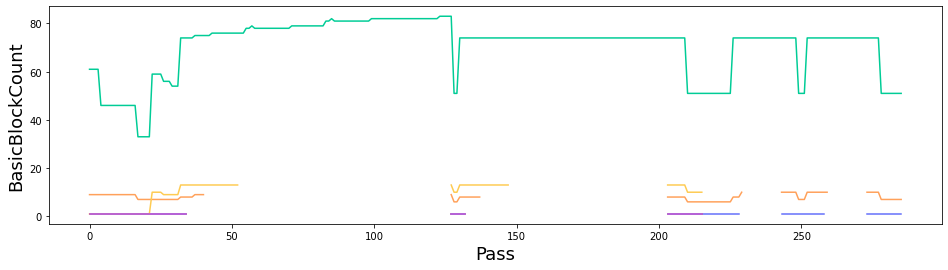

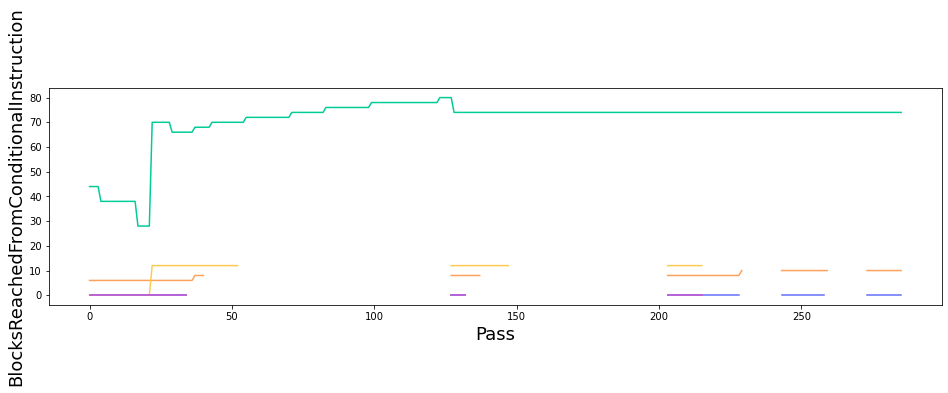

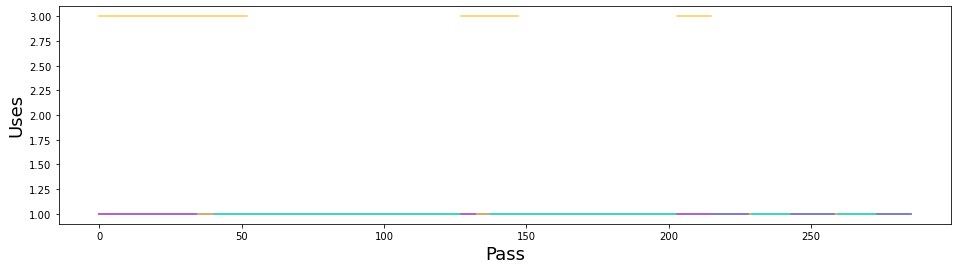

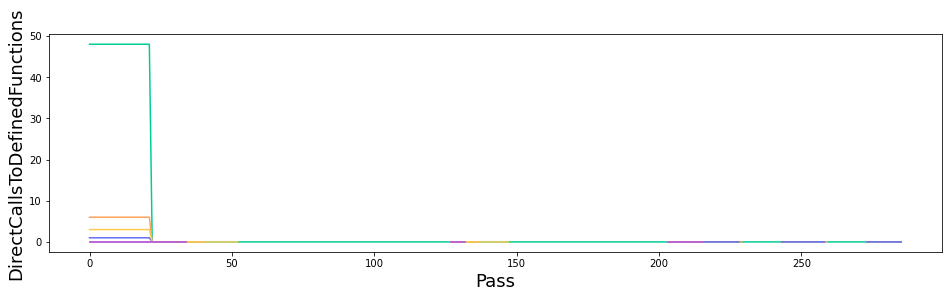

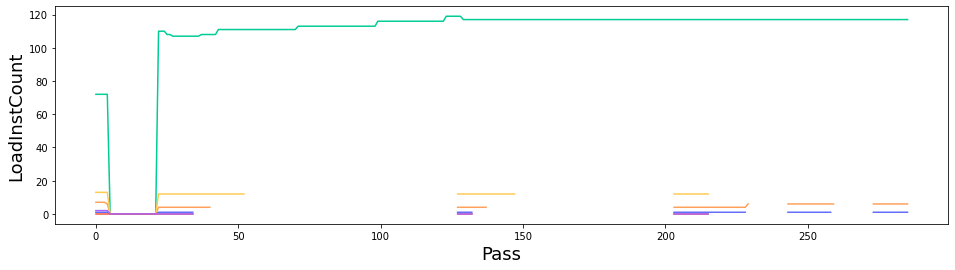

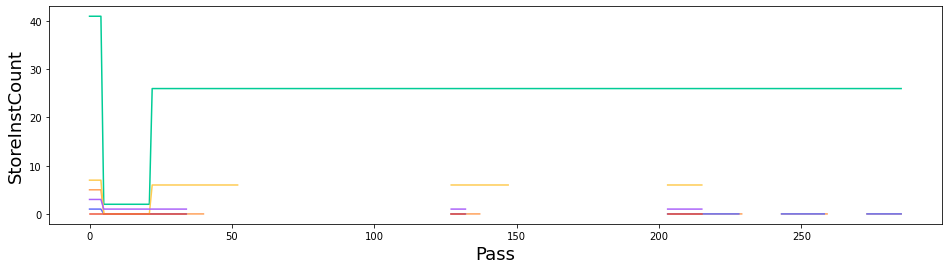

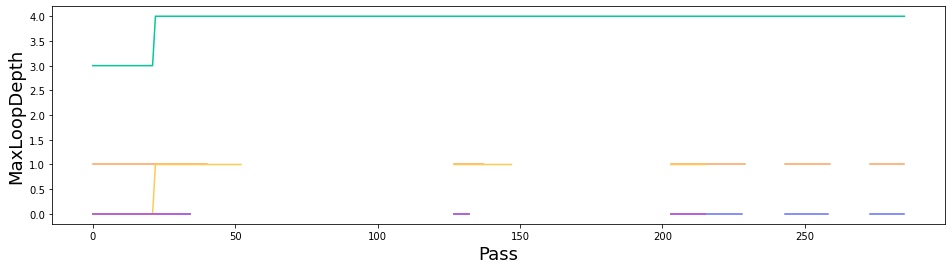

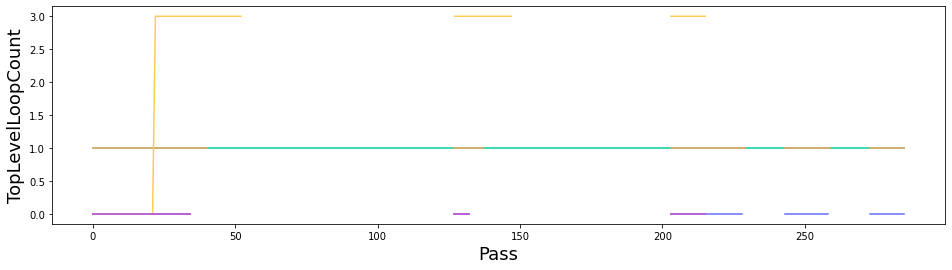

In [76]:
for i in range(len(functionPropertiesNames)):
    getFeatureSubplot(i)
    

In [78]:
feature_no = 0
FeatureDF = passPipelineDF.drop(columns=['Pass Number'], level=0)
FeatureDF = FeatureDF[FeatureDF.columns[feature_no::8]]
FeatureDF.columns = list(range(len(passList)))
FeatureDF = FeatureDF.apply(pd.to_numeric)
FeatureDF = pd.concat([FeatureDF, pd.DataFrame({'cluster_scaled':labels_tsne_scale})], axis=1)
FeatureDF = pd.concat([FeatureDF, pd.DataFrame({'count':passPipelineDFScale['count']})], axis=1)
FeatureDF = FeatureDF.sort_values('count', ascending=False).drop_duplicates(['cluster_scaled'])
FeatureDF

joined_df = FeatureDF.drop(columns=['count'])

cmap = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']
functions = passPipelineDF.loc[:, [('Pass Number', 'Function Name')]].to_numpy()
passes = pd.DataFrame(passList).to_numpy()

fig = go.Figure(go.Scatter(
    hovertemplate =
    '<i>Price</i>: $%{y:.2f}'+
    '<br><b>X</b>: %{x}<br>'+
    '<b>%{text}</b>',
    showlegend = False))

for index, row in joined_df.iterrows():
    fn_name = functions[index][0]
    fig.add_trace(go.Scatter(
                        x=row[:-1].index.to_numpy(), 
                        y=row[:-1].to_numpy(),
                        text= passes,
                        hovertemplate = 'Function Name: ' + fn_name 
                                    + '<br>Function No: ' + str(index) 
                                    + '<br>Pass Name: %{text}'
                                    + '<br>Pass No: %{x} ' 
                                    + '<br>BasicBlockCount: %{y}',
                        mode='lines',
                        marker_color=cmap[int(row['cluster_scaled'])],
                        name='',
                        showlegend = False
        )
    )
    
fig.show()


# Model

In [79]:
raw_labels_df = pd.DataFrame({'cluster':labels_tsne_scale})
raw_features_df = passPipelineDF

In [83]:
def preprocess_features(input_features_df):
    features_df = input_features_df.copy()
    
    features_df = features_df[['0','30']]
    features_df = features_df.apply(pd.to_numeric)
    
    return features_df

In [84]:
features_df = preprocess_features(raw_features_df)
features_df.dtypes

0   BasicBlockCount                            int64
    BlocksReachedFromConditionalInstruction    int64
    Uses                                       int64
    DirectCallsToDefinedFunctions              int64
    LoadInstCount                              int64
    StoreInstCount                             int64
    MaxLoopDepth                               int64
    TopLevelLoopCount                          int64
30  BasicBlockCount                            int64
    BlocksReachedFromConditionalInstruction    int64
    Uses                                       int64
    DirectCallsToDefinedFunctions              int64
    LoadInstCount                              int64
    StoreInstCount                             int64
    MaxLoopDepth                               int64
    TopLevelLoopCount                          int64
dtype: object

In [85]:
labels_df = raw_labels_df
labels_df

,cluster
0,1
1,0
2,1
3,1
4,2
...,...
295,1
296,0
297,3
298,1


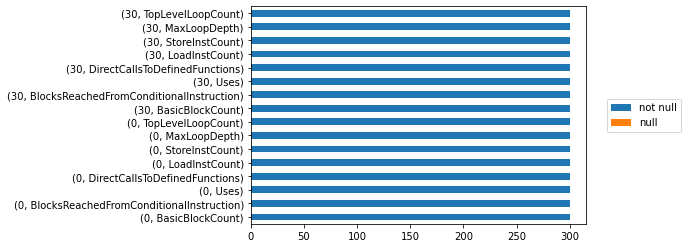

In [86]:
df = pd.DataFrame({'not null': features_df.count(),
                   'null': features_df.isnull().sum()})

ax = df.plot.barh(stacked=True)

ax.legend(
    loc='center left', 
    bbox_to_anchor=(1.05, 0.5)
)

In [87]:
from sklearn.model_selection import train_test_split
RANDOM_SEED = 7

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    features_df,
    labels_df,
    test_size=0.2,
    shuffle=True,
    stratify=labels_df,
    random_state=45
)

In [88]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

In [89]:
model = XGBClassifier(n_jobs=-1)
model.fit(X_train, y_train.values.ravel())

XGBClassifier(n_jobs=-1, objective='multi:softprob')

In [90]:
y_pred = model.predict(X_train)

In [91]:
accuracy = accuracy_score(y_train, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 97.50%


In [92]:
f1 = f1_score(y_train, y_pred, average='weighted')
print("F1 Score: %.2f" % (f1))

F1 Score: 0.97


In [93]:
y_test_pred = model.predict(X_test)

In [94]:
accuracy = accuracy_score(y_test, y_test_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 85.00%


In [95]:
f1 = f1_score(y_test, y_test_pred, average='weighted')
print("F1 Score: %.2f" % (f1))

F1 Score: 0.85


<function matplotlib.pyplot.show(*args, **kw)>

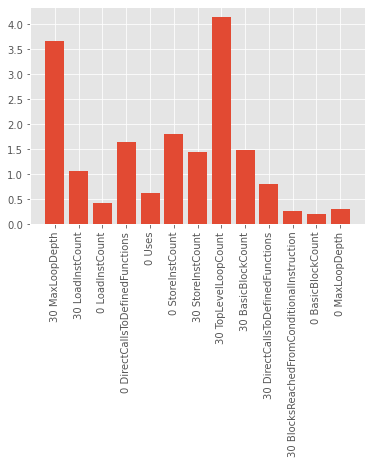

In [98]:
feature_importnace = model.get_booster().get_score(importance_type="gain")

import matplotlib.pyplot as plt
plt.style.use('ggplot')

plt.bar(range(len(feature_importnace)), list(feature_importnace.values()), align='center')
plt.xticks(range(len(feature_importnace)), list(feature_importnace.keys()), rotation='vertical')

plt.show